In [1]:
import os
import sys
#sys.path.append('/home/cjw/Code/DeepLearning')

import tensorflow as tf
import numpy as np
import pandas as pd

from autoencoder import autoencoder_train
from autoencoder import network
from autoencoder import utils

In [2]:
#datadir = "/v/Data/cyto/ChannelOne/"
datadir = "/media/cjw/Data/cyto/mmFromTifs3"

mmfiles = utils.list_mmfiles(datadir)
print(mmfiles)

mmdict = dict()

n_all_images = 0
for mmfilename in mmfiles:
#mmfilename = datadir + "Fish6_15_cjw_mean_zero.mm"
#mmfilename = datadir + "mmplate15-1.mm"
    mmheader = np.memmap(mmfilename, dtype="int32", mode='r',
                    shape=(4,))

    header_shape = mmheader.shape
    print(header_shape, mmheader)
    xshape = [mmheader[0], mmheader[1], mmheader[2], mmheader[3]]
    xshape = tuple(xshape)
    del mmheader
    n_all_images += xshape[0]
    
    m3 = np.memmap(mmfilename, dtype='float32', offset=128,
              mode='r', shape=xshape)
    key = mmfilename.split("/")[-1]
    mmdict[key] = m3

print(n_all_images)
mmdict.keys()

['/media/cjw/Data/cyto/mmFromTifs3/Fish6_Untreated.mm', '/media/cjw/Data/cyto/mmFromTifs3/Fish6_ICE.mm', '/media/cjw/Data/cyto/mmFromTifs3/Fish6_CCB.mm']
(4,) [10000    64    64     5]
(4,) [10000    64    64     5]
(4,) [10000    64    64     5]
30000


dict_keys(['Fish6_Untreated.mm', 'Fish6_ICE.mm', 'Fish6_CCB.mm'])

In [3]:
n = xshape[0]
all_ids =  range(n_all_images)
idx = 0
dataframes = list()
for key in mmdict.keys():
    mm = mmdict[key]
    n = mm.shape[0]
    print(n)
    file = n*[key[0:-3]]
    fid = range(n)
    mmfile = n*[key]
    plate = n*[0]
    row = n*[0]
    column = n*[0]
    field = n*[0]
    yc = n*[32]
    xc = n*[32]
    well = n*[0]
    ids = all_ids[idx:idx + n]
    idx += n
    df = pd.DataFrame({'id':ids, 'fid':fid, 'file':file, 'mmfile':mmfile, 'plate':plate,
                     'row':row, 'column':column, 'field':field,
                      'yc':yc, 'xc':xc, 'well':well})

    dataframes.append(df)
    
p_df = pd.concat(dataframes, ignore_index=True)

10000
10000
10000


Encoder True
[<tf.Tensor 'Placeholder:0' shape=(?, 32, 32, 4) dtype=float32>, <tf.Tensor 'dropout/mul:0' shape=(?, 16, 16, 128) dtype=float32>, <tf.Tensor 'dropout_1/mul:0' shape=(?, 8, 8, 256) dtype=float32>, <tf.Tensor 'dropout_2/mul:0' shape=(?, 4, 4, 512) dtype=float32>] Tensor("latent_space/BiasAdd:0", shape=(?, 128), dtype=float32)
isize:  4 32
dh0 (?, 32, 32, 4)
[<tf.Tensor 'dropout_3/mul:0' shape=(?, 8192) dtype=float32>, <tf.Tensor 'Reshape:0' shape=(?, 4, 4, 512) dtype=float32>, <tf.Tensor 'dropout_4/mul:0' shape=(?, 8, 8, 256) dtype=float32>, <tf.Tensor 'dropout_5/mul:0' shape=(?, 16, 16, 128) dtype=float32>] Tensor("Minimum:0", shape=(?, 32, 32, 4), dtype=float32)
Tensor("Mean_1:0", shape=(), dtype=float32) Tensor("Mean_2:0", shape=(), dtype=float32) Tensor("add_5:0", shape=(), dtype=float32)
30000 234 128
Epoch:  0 Iteration:  0 Loss:  620.409 2.78343 0.298093


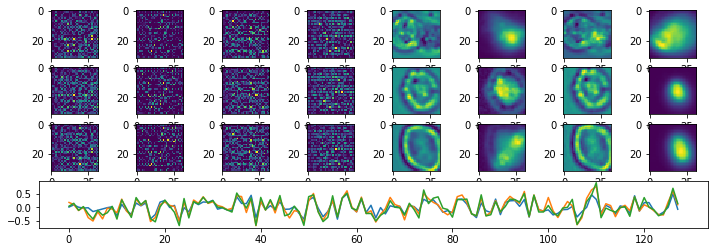

Epoch:  1 Iteration:  0 Loss:  17.6366 0.637531 0.00159737


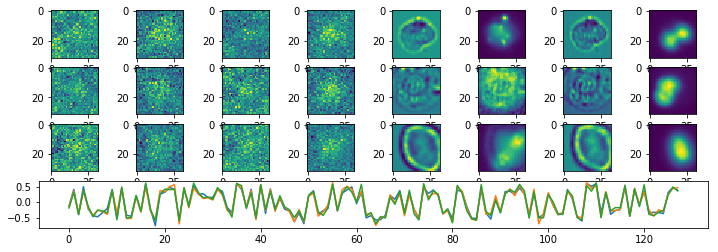

Epoch:  2 Iteration:  0 Loss:  16.169 0.636687 0.00292367


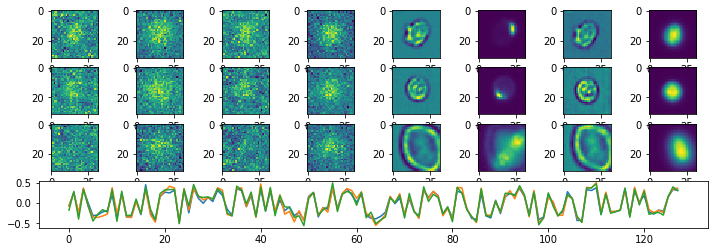

Epoch:  3 Iteration:  0 Loss:  13.6529 0.635315 0.00260347


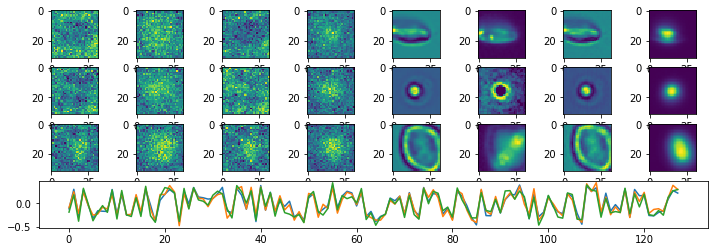

Epoch:  4 Iteration:  0 Loss:  12.3381 0.634628 0.00234133


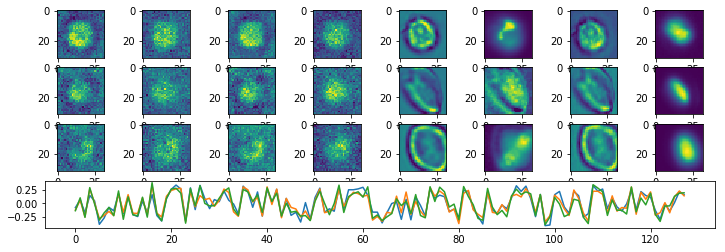

Epoch:  5 Iteration:  0 Loss:  11.3025 0.634081 0.00148964


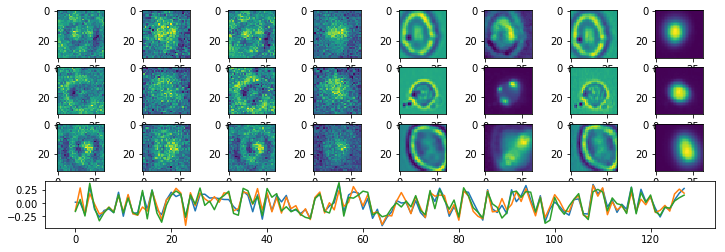

Epoch:  6 Iteration:  0 Loss:  10.3593 0.633597 0.00159657


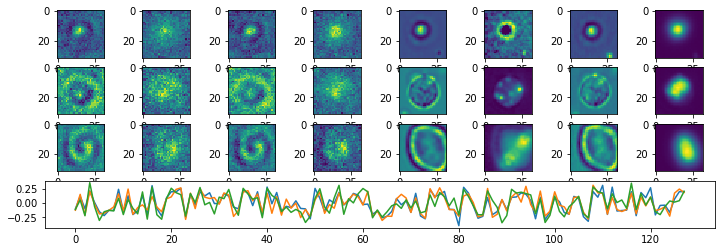

Epoch:  7 Iteration:  0 Loss:  9.70472 0.633254 0.00236574


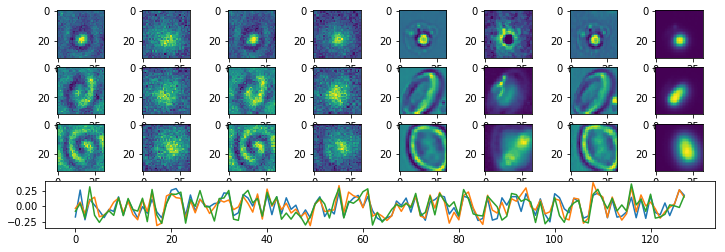

Epoch:  8 Iteration:  0 Loss:  8.79537 0.632764 0.000811338


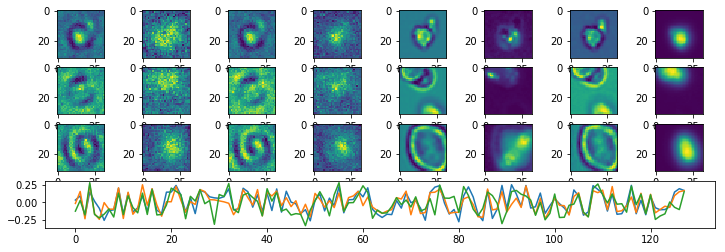

Epoch:  9 Iteration:  0 Loss:  8.1359 0.632421 0.0011425


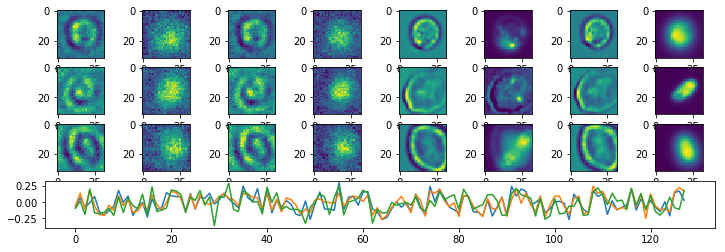

Epoch:  10 Iteration:  0 Loss:  7.64104 0.632165 0.00138712


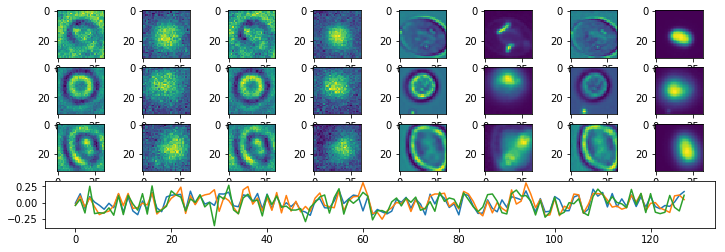

Epoch:  11 Iteration:  0 Loss:  7.39126 0.632034 0.00184977


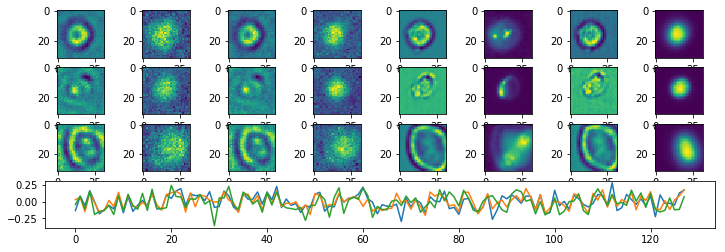

Epoch:  12 Iteration:  0 Loss:  6.9738 0.631817 0.000927627


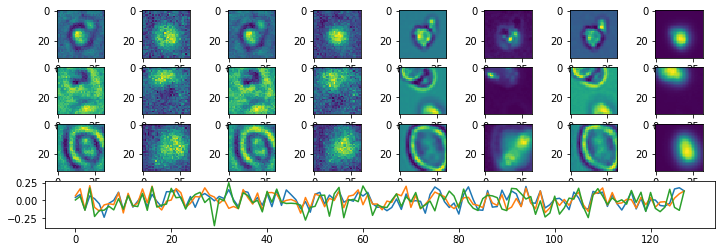

Epoch:  13 Iteration:  0 Loss:  6.73373 0.631691 0.000800639


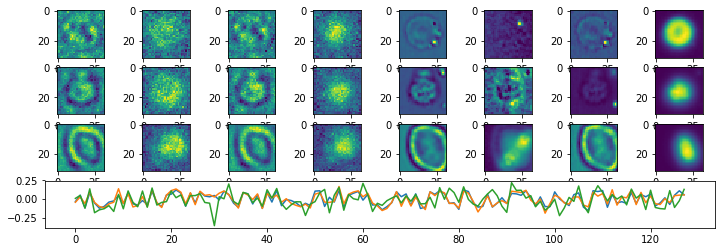

Epoch:  14 Iteration:  0 Loss:  6.68465 0.631665 0.00183263


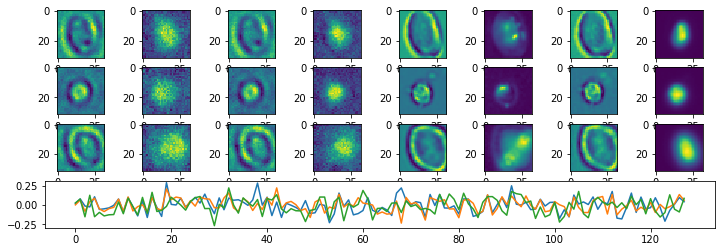

Epoch:  15 Iteration:  0 Loss:  6.34683 0.631492 0.00137559


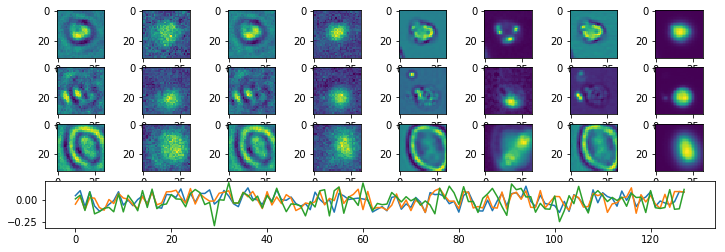

Epoch:  16 Iteration:  0 Loss:  6.09371 0.631359 0.0012247


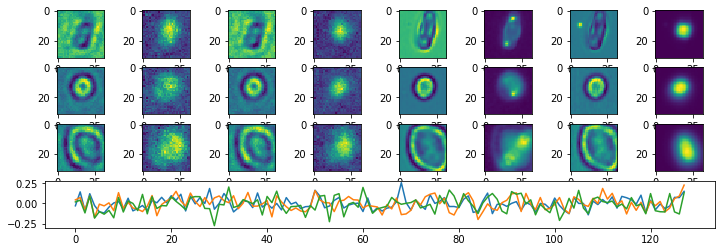

Epoch:  17 Iteration:  0 Loss:  6.03847 0.631329 0.00161526


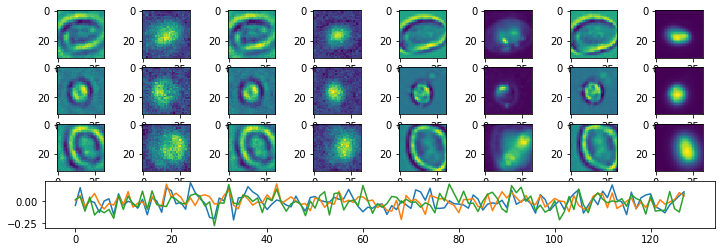

Epoch:  18 Iteration:  0 Loss:  5.74694 0.631178 0.000873417


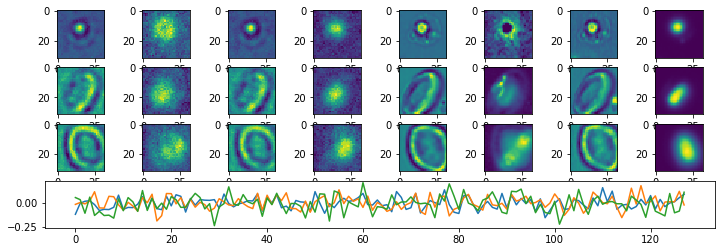

Epoch:  19 Iteration:  0 Loss:  5.5862 0.631094 0.000819445


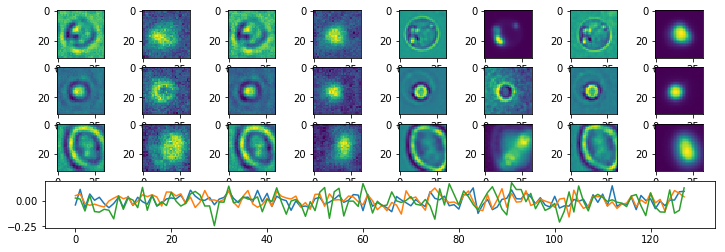

Epoch:  20 Iteration:  0 Loss:  5.48919 0.631043 0.00135961


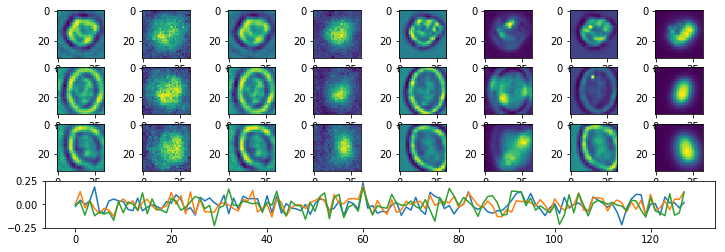

Epoch:  21 Iteration:  0 Loss:  5.3854 0.630986 0.00053826


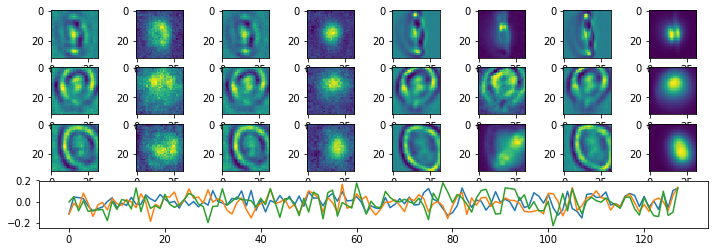

Epoch:  22 Iteration:  0 Loss:  5.1913 0.630885 0.000844836


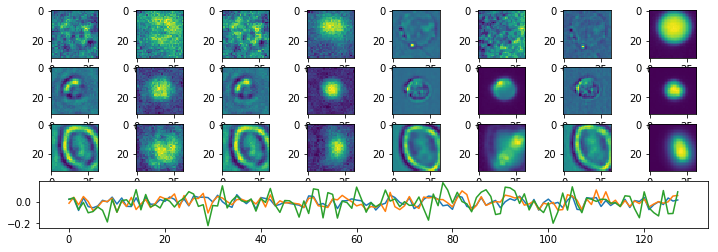

Epoch:  23 Iteration:  0 Loss:  5.0624 0.630814 0.000622541


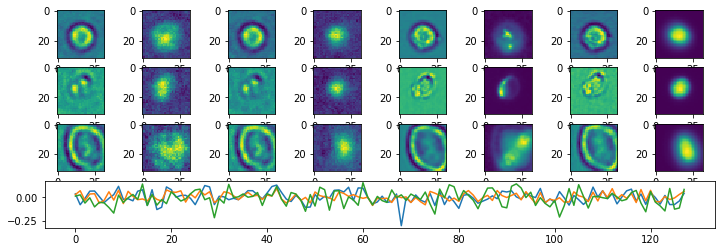

Epoch:  24 Iteration:  0 Loss:  4.89918 0.630727 0.000648528


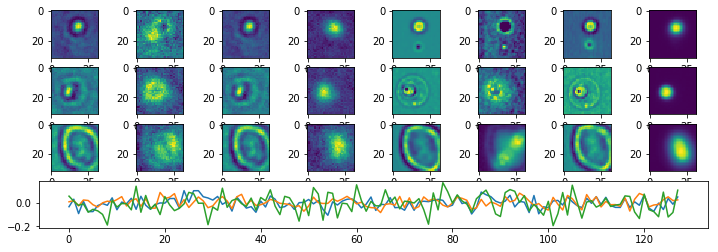

Epoch:  25 Iteration:  0 Loss:  4.85031 0.630702 0.000558555


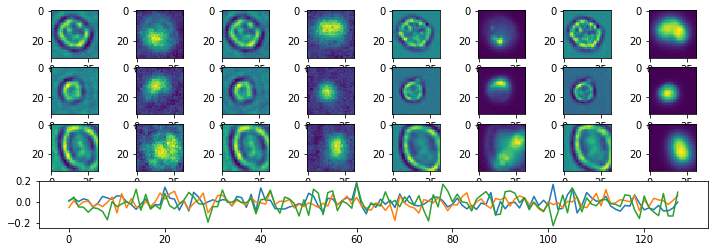

Epoch:  26 Iteration:  0 Loss:  4.7116 0.630627 0.00074631


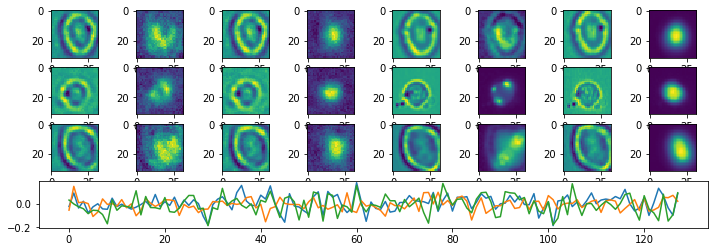

Epoch:  27 Iteration:  0 Loss:  4.61565 0.630575 0.00117412


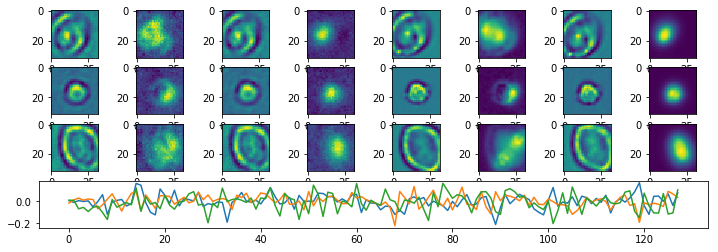

Epoch:  28 Iteration:  0 Loss:  4.48413 0.630507 0.000953734


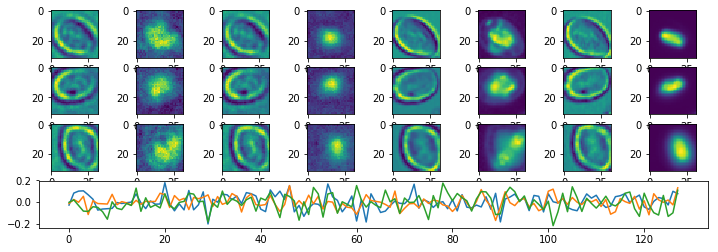

Epoch:  29 Iteration:  0 Loss:  4.47654 0.630502 0.00139627


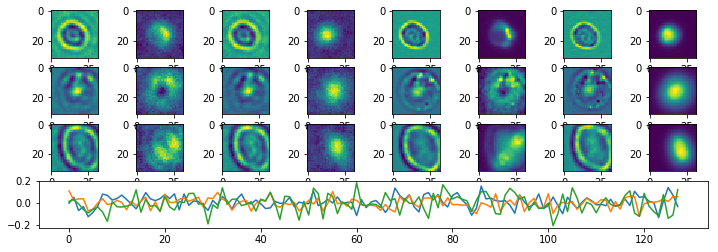

Epoch:  30 Iteration:  0 Loss:  4.40322 0.630464 0.000101447


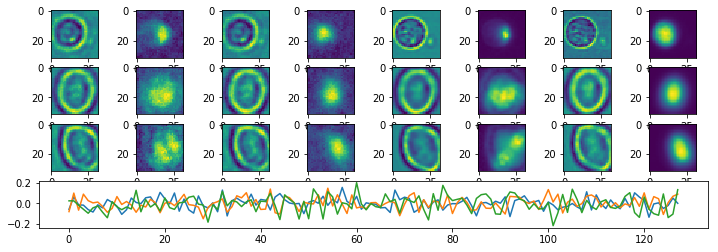

Epoch:  31 Iteration:  0 Loss:  4.31878 0.630419 0.00110871


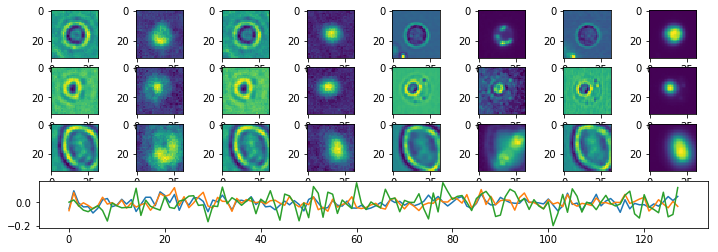

Epoch:  32 Iteration:  0 Loss:  4.26919 0.630392 0.000933588


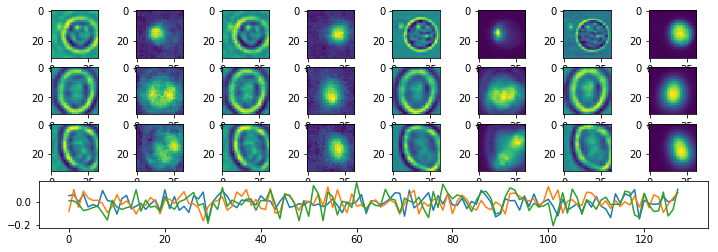

Epoch:  33 Iteration:  0 Loss:  4.17946 0.630346 0.000649363


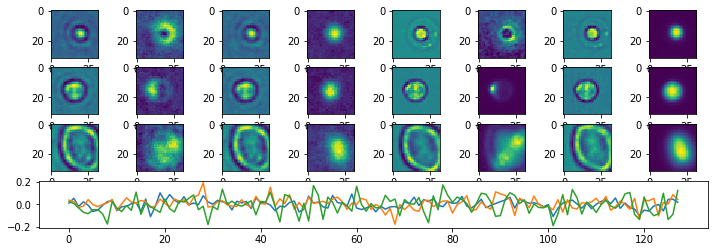

Epoch:  34 Iteration:  0 Loss:  4.16252 0.630338 0.00060761


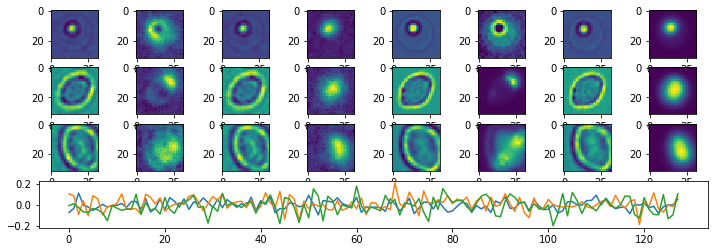

Epoch:  35 Iteration:  0 Loss:  4.07186 0.630291 0.000600964


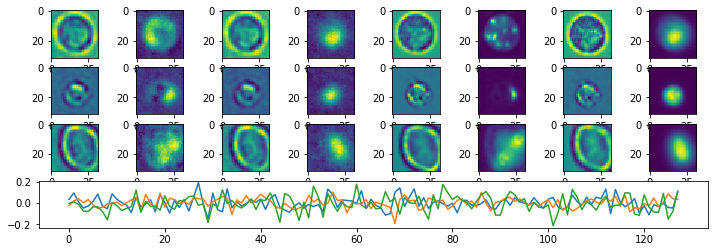

Epoch:  36 Iteration:  0 Loss:  4.02704 0.630266 0.000609756


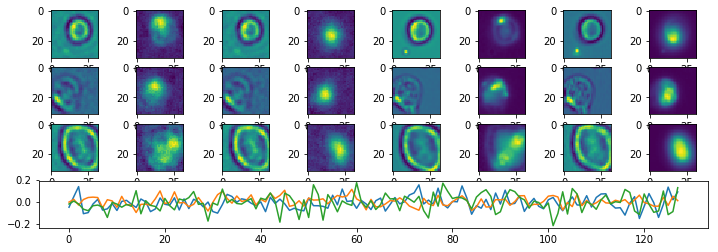

Epoch:  37 Iteration:  0 Loss:  3.98634 0.630245 0.000529766


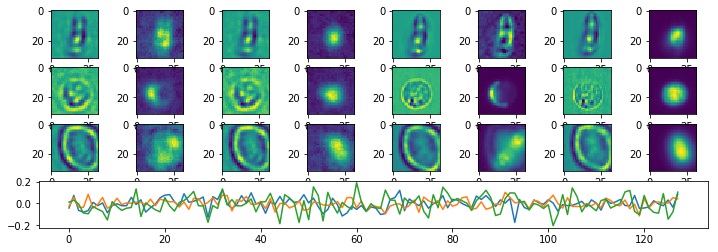

Epoch:  38 Iteration:  0 Loss:  3.92698 0.630215 0.000644654


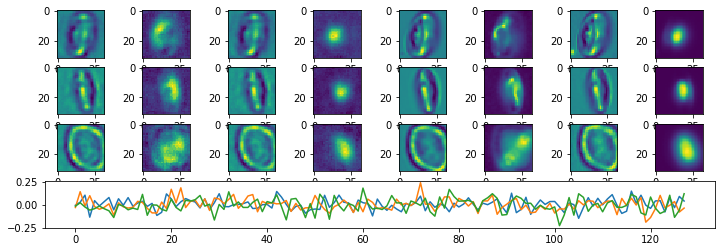

Epoch:  39 Iteration:  0 Loss:  3.87963 0.63019 0.000746787


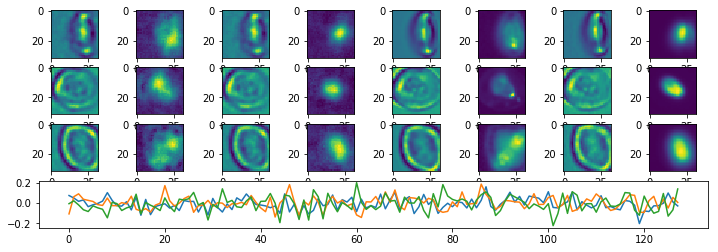

Epoch:  40 Iteration:  0 Loss:  3.89748 0.630198 0.000241786


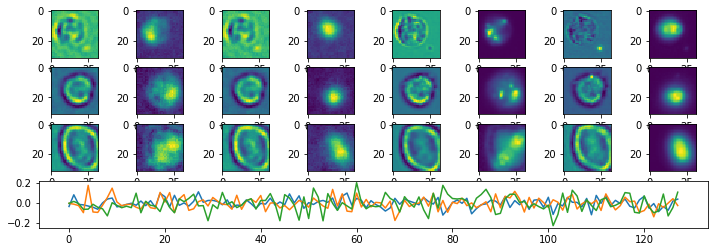

Epoch:  41 Iteration:  0 Loss:  3.81252 0.630156 0.000330031


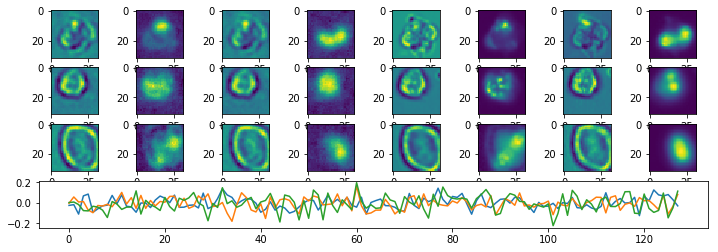

Epoch:  42 Iteration:  0 Loss:  3.79158 0.630143 0.000556648


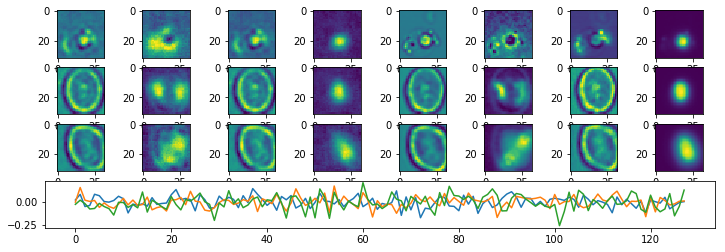

Epoch:  43 Iteration:  0 Loss:  3.74988 0.630122 0.000672519


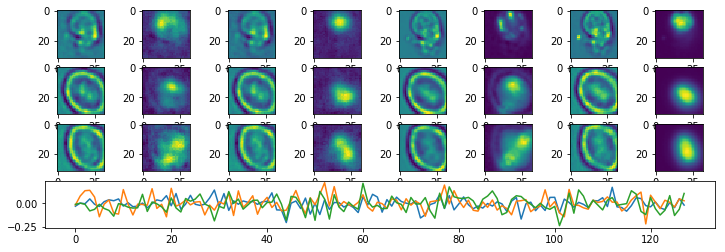

Epoch:  44 Iteration:  0 Loss:  3.74624 0.63012 0.000848353


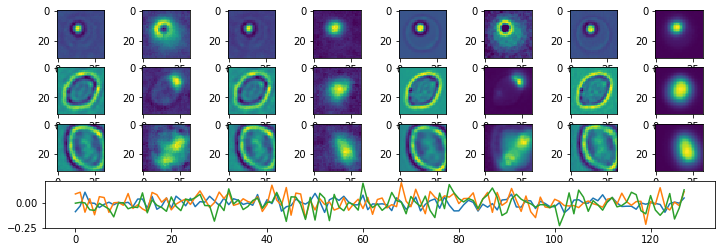

Epoch:  45 Iteration:  0 Loss:  3.71556 0.630103 0.000932783


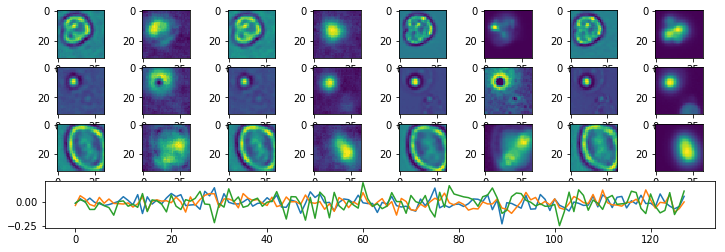

Epoch:  46 Iteration:  0 Loss:  3.65989 0.630074 0.000482053


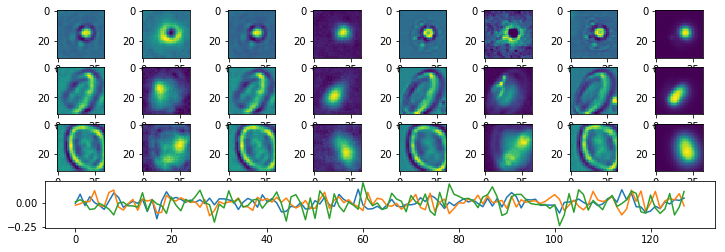

Epoch:  47 Iteration:  0 Loss:  3.62173 0.630056 0.000651091


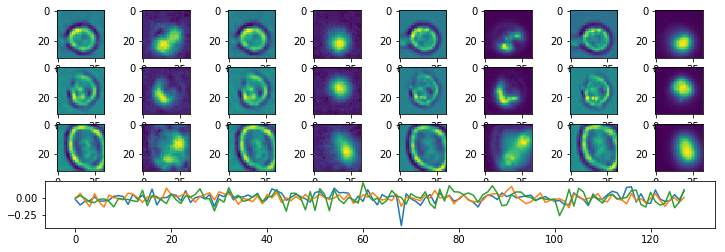

Epoch:  48 Iteration:  0 Loss:  3.60923 0.630049 0.000439525


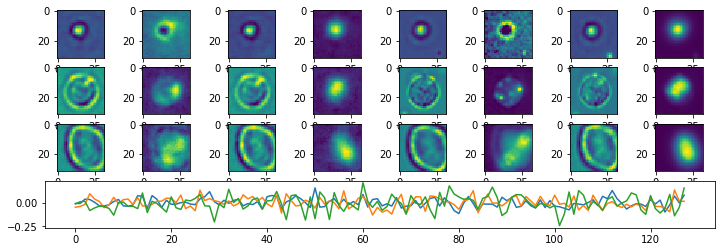

Epoch:  49 Iteration:  0 Loss:  3.57895 0.630034 0.000649959


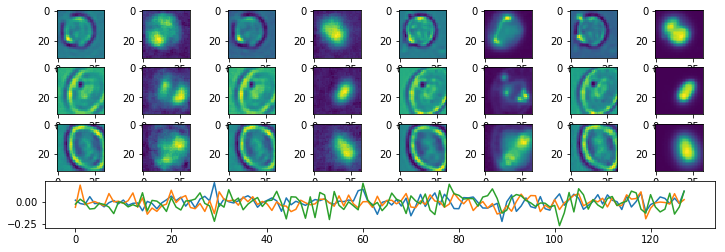

Epoch:  50 Iteration:  0 Loss:  3.55483 0.630021 0.000762939


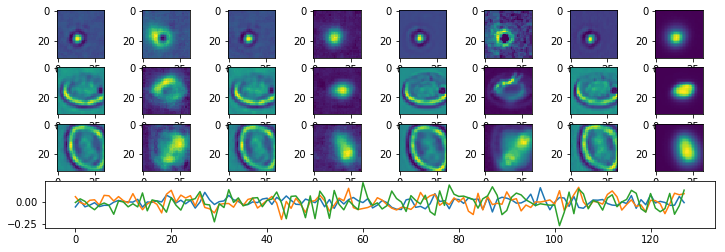

Epoch:  51 Iteration:  0 Loss:  3.53132 0.630009 0.000106066


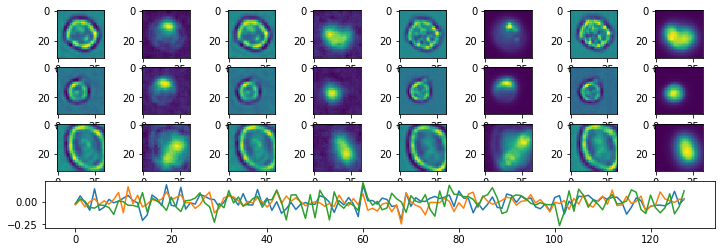

Epoch:  52 Iteration:  0 Loss:  3.55432 0.63002 0.000619382


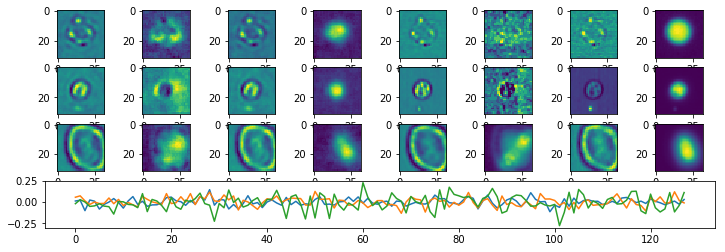

Epoch:  53 Iteration:  0 Loss:  3.44365 0.629963 0.000542194


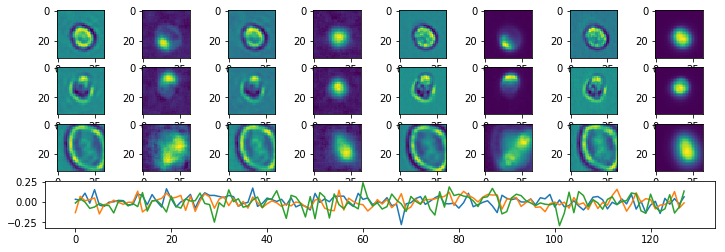

Epoch:  54 Iteration:  0 Loss:  3.45317 0.629968 0.000450641


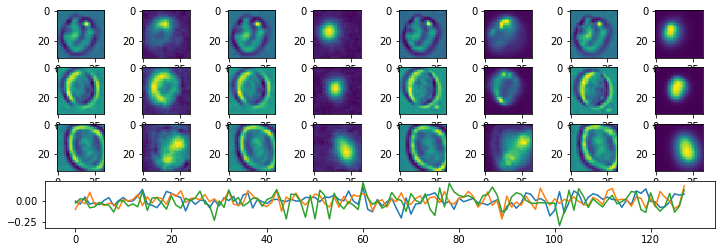

Epoch:  55 Iteration:  0 Loss:  3.42461 0.629953 0.000683069


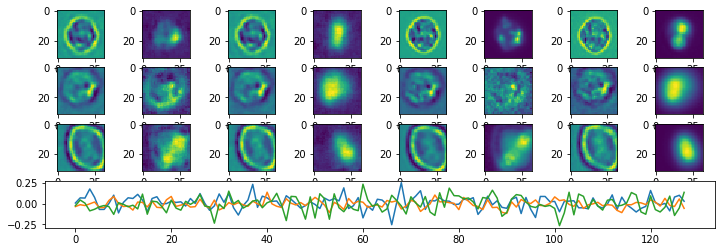

Epoch:  56 Iteration:  0 Loss:  3.45055 0.629966 0.000619769


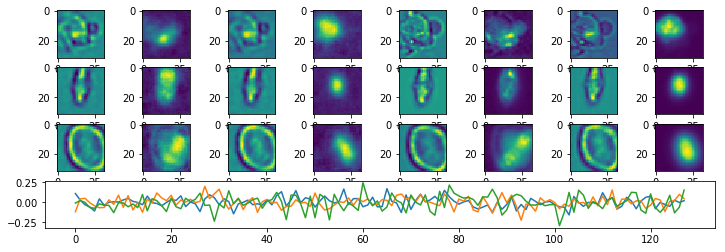

Epoch:  57 Iteration:  0 Loss:  3.408 0.629945 0.000260204


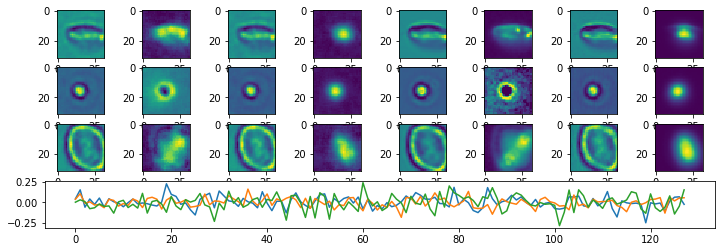

Epoch:  58 Iteration:  0 Loss:  3.36739 0.629924 0.0003317


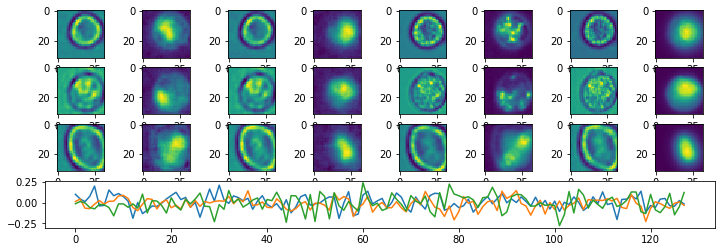

Epoch:  59 Iteration:  0 Loss:  3.37439 0.629926 0.000429422


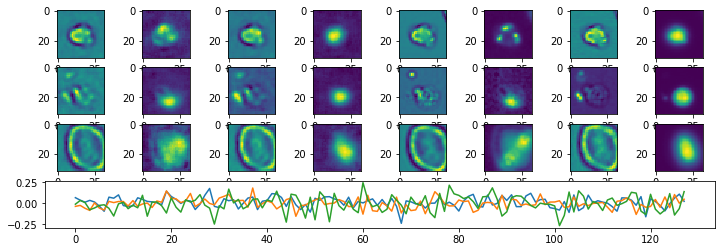

Epoch:  60 Iteration:  0 Loss:  3.39873 0.629939 0.000316024


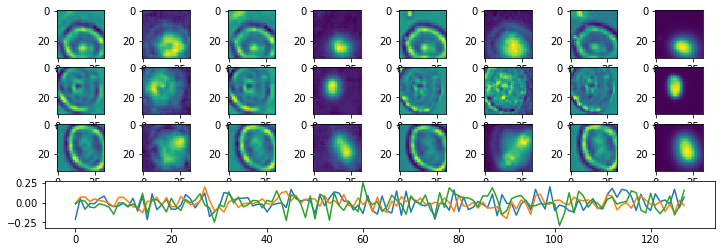

Epoch:  61 Iteration:  0 Loss:  3.37252 0.629926 0.000675499


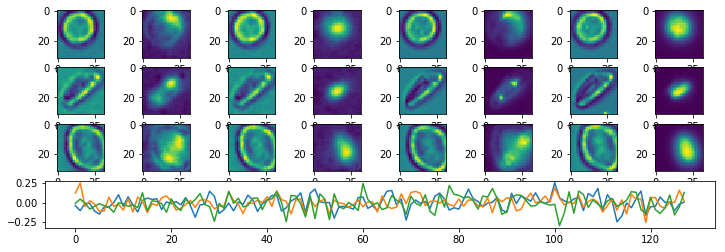

Epoch:  62 Iteration:  0 Loss:  3.28747 0.629883 0.000431299


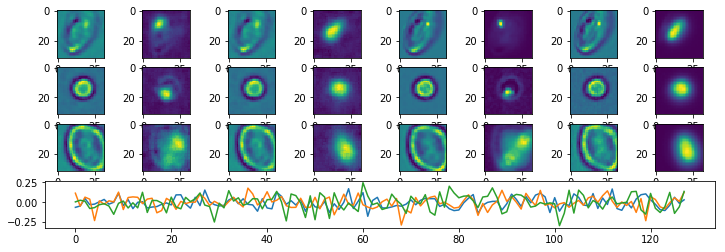

Epoch:  63 Iteration:  0 Loss:  3.29928 0.629888 0.000388592


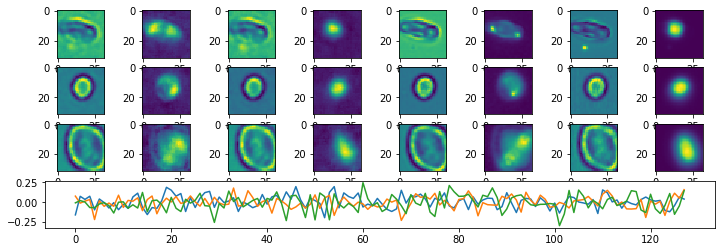

Epoch:  64 Iteration:  0 Loss:  3.34644 0.629912 0.000509709


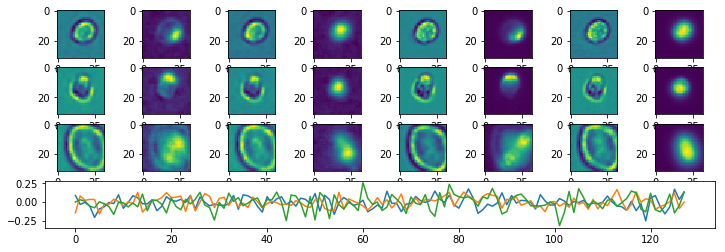

Epoch:  65 Iteration:  0 Loss:  3.31933 0.629898 0.000865877


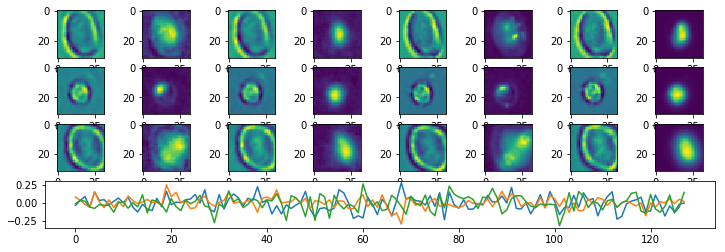

Epoch:  66 Iteration:  0 Loss:  3.26965 0.629873 0.000311494


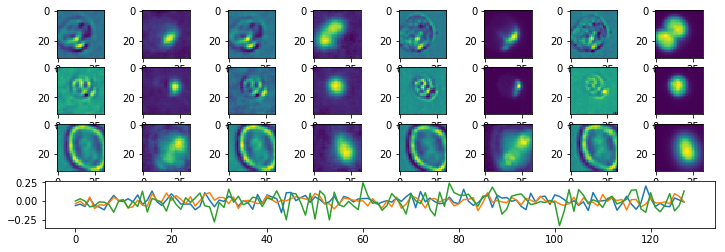

Epoch:  67 Iteration:  0 Loss:  3.33717 0.629909 0.00036782


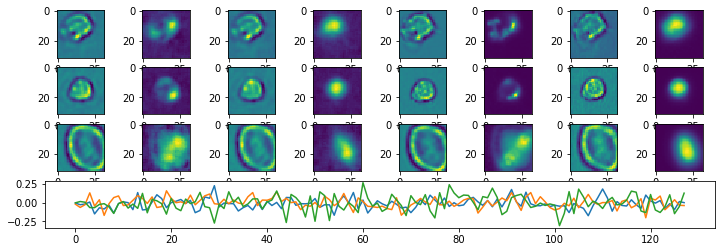

Epoch:  68 Iteration:  0 Loss:  3.26532 0.62987 0.000340044


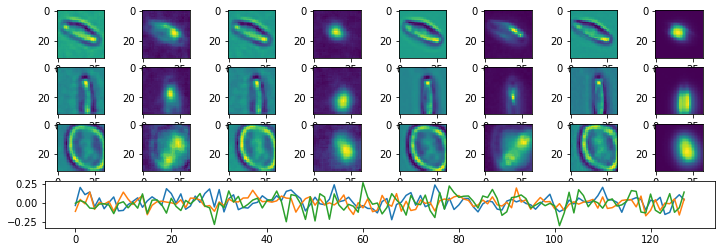

Epoch:  69 Iteration:  0 Loss:  3.22835 0.629851 0.000490397


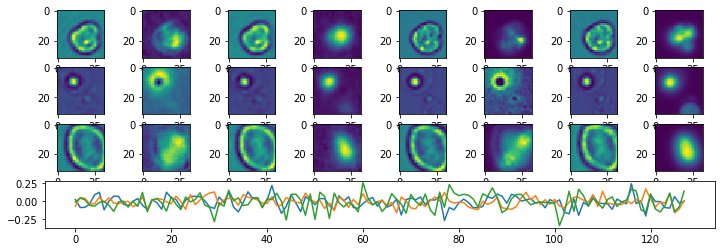

Epoch:  70 Iteration:  0 Loss:  3.21877 0.629846 0.000291437


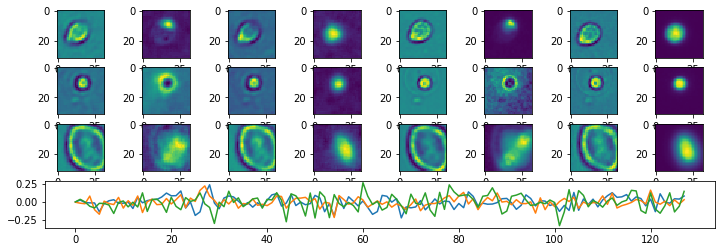

Epoch:  71 Iteration:  0 Loss:  3.20841 0.629841 0.000551462


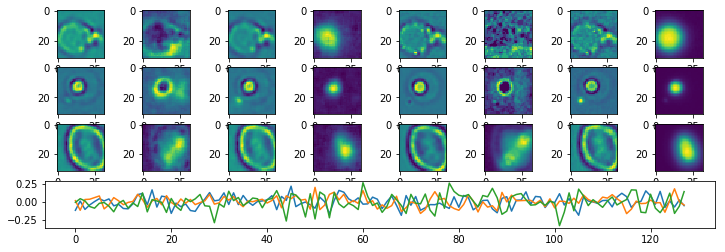

Epoch:  72 Iteration:  0 Loss:  3.1877 0.629832 0.000325978


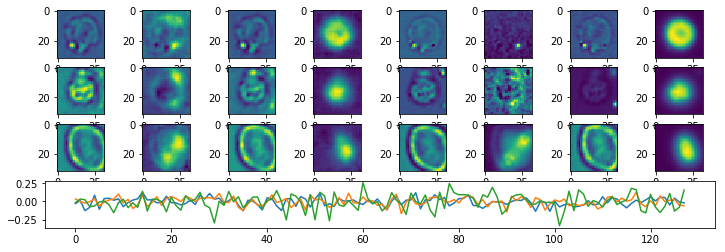

Epoch:  73 Iteration:  0 Loss:  3.23549 0.629856 0.000550866


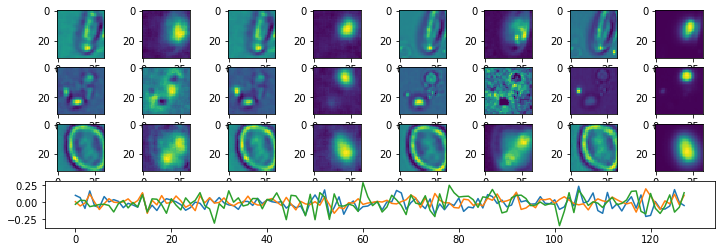

Epoch:  74 Iteration:  0 Loss:  3.15407 0.629815 0.00036779


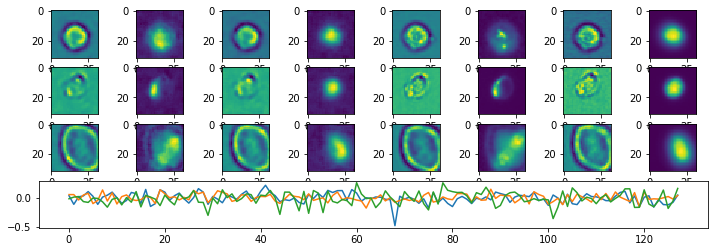

Epoch:  75 Iteration:  0 Loss:  4.10947 0.630316 0.000870794


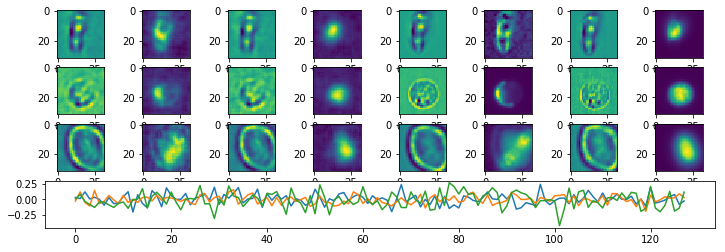

Epoch:  76 Iteration:  0 Loss:  3.56033 0.630026 0.000548512


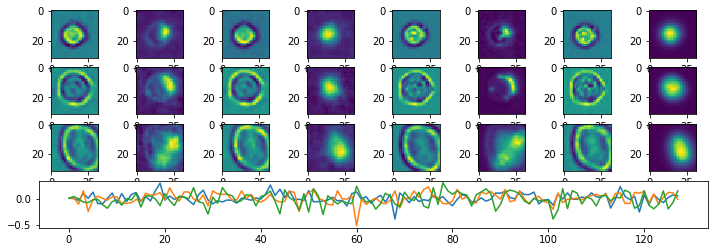

Epoch:  77 Iteration:  0 Loss:  3.40034 0.629941 0.000554323


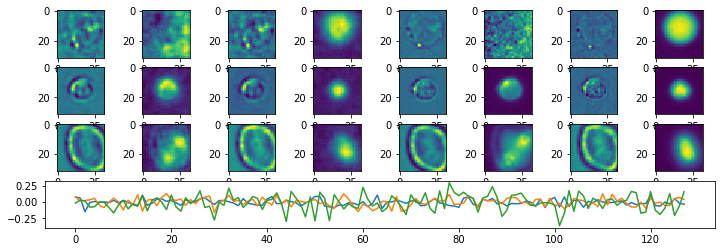

Epoch:  78 Iteration:  0 Loss:  3.30927 0.629894 0.000512928


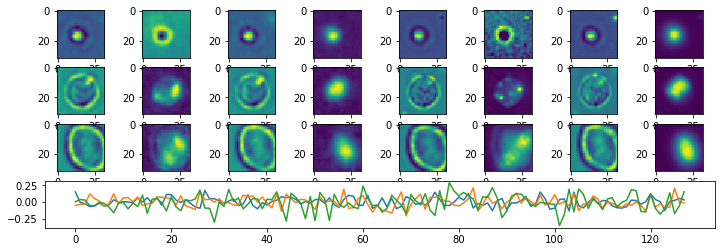

Epoch:  79 Iteration:  0 Loss:  3.2961 0.629887 0.000461251


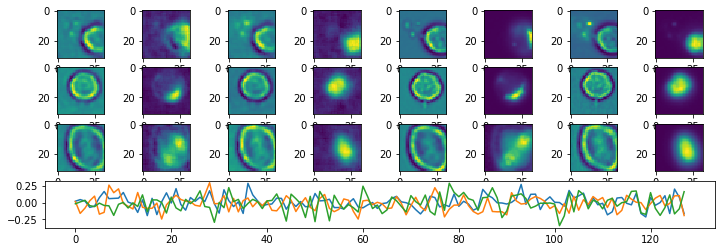

Epoch:  80 Iteration:  0 Loss:  3.23349 0.629854 0.000506192


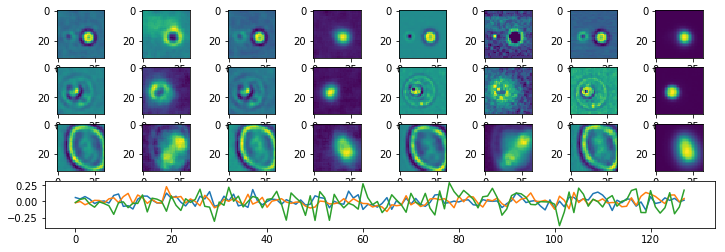

Epoch:  81 Iteration:  0 Loss:  3.22226 0.629848 0.000505686


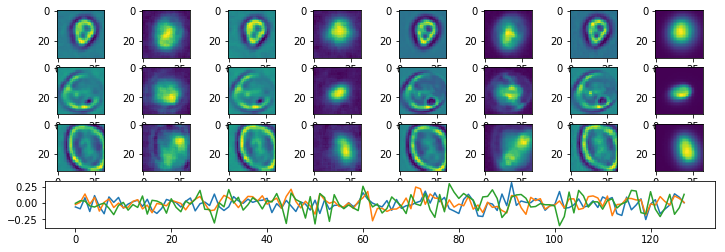

Epoch:  82 Iteration:  0 Loss:  3.19794 0.629836 0.000419378


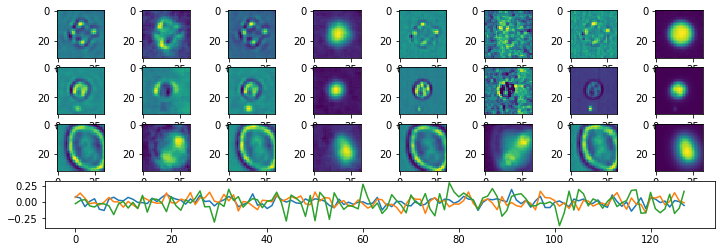

Epoch:  83 Iteration:  0 Loss:  3.19607 0.629835 0.000515789


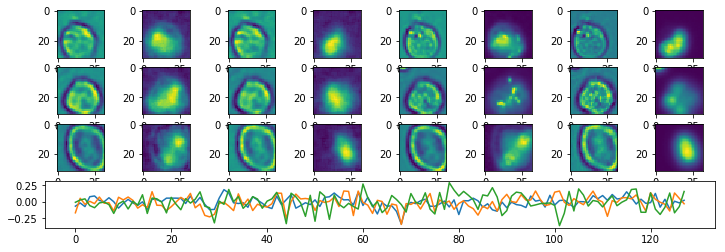

Epoch:  84 Iteration:  0 Loss:  3.16164 0.629818 0.000467211


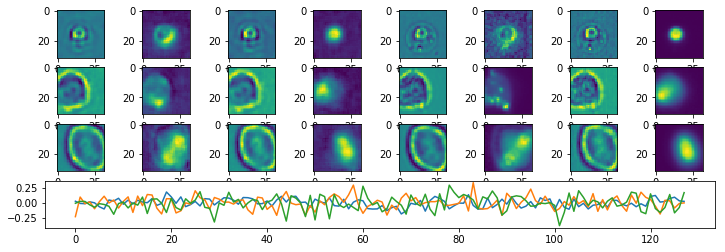

Epoch:  85 Iteration:  0 Loss:  3.18131 0.629827 0.000471711


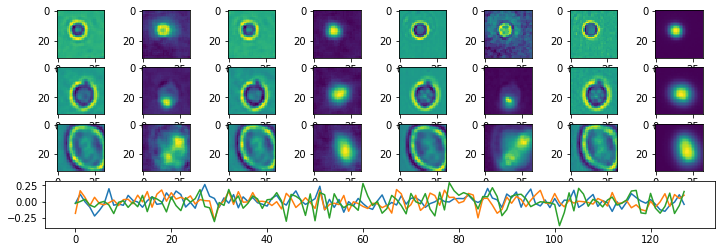

Epoch:  86 Iteration:  0 Loss:  3.14043 0.629806 0.00048539


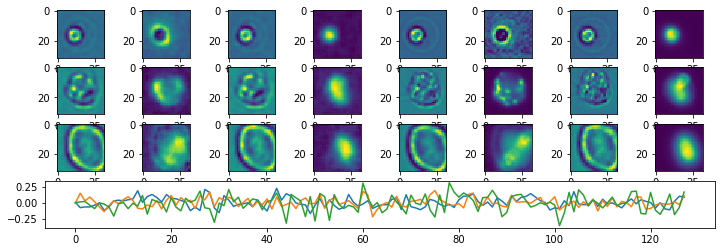

Epoch:  87 Iteration:  0 Loss:  3.17941 0.629827 0.000420749


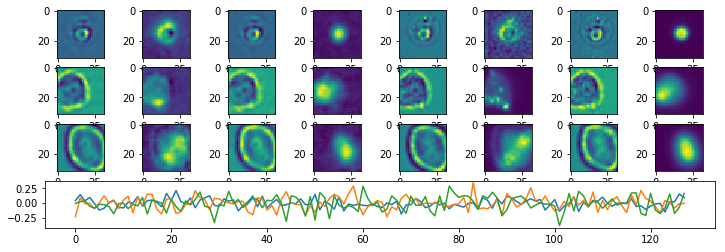

Epoch:  88 Iteration:  0 Loss:  3.15461 0.629814 0.000450194


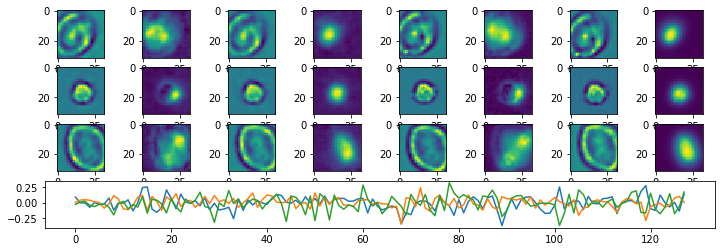

Epoch:  89 Iteration:  0 Loss:  3.11549 0.629794 0.000493735


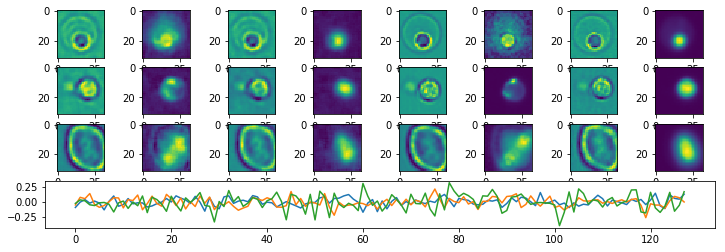

Epoch:  90 Iteration:  0 Loss:  3.14973 0.629811 0.000554711


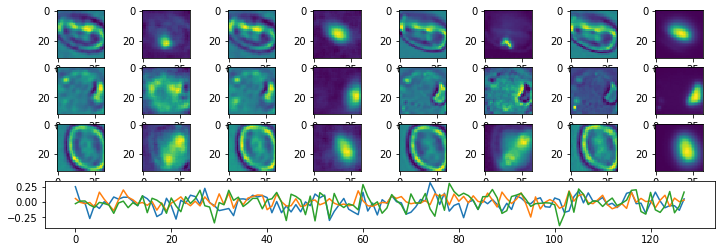

Epoch:  91 Iteration:  0 Loss:  3.07833 0.629775 0.000478715


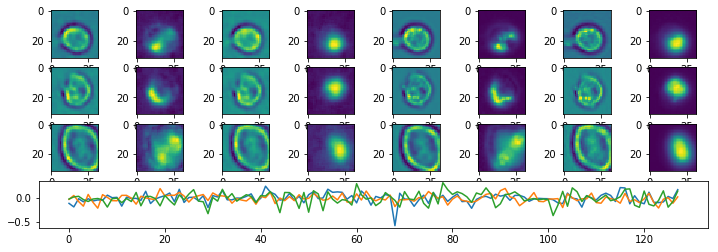

Epoch:  92 Iteration:  0 Loss:  3.09711 0.629784 0.000437587


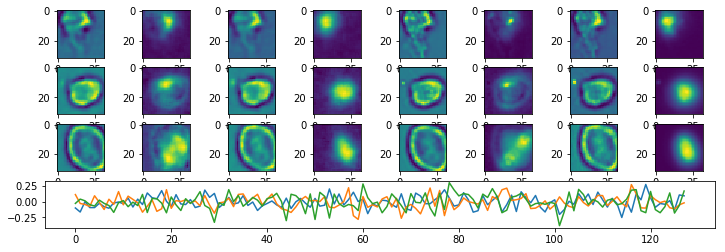

Epoch:  93 Iteration:  0 Loss:  3.05347 0.629762 0.000534594


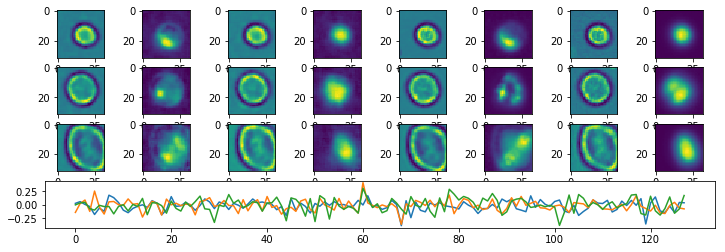

Epoch:  94 Iteration:  0 Loss:  3.05595 0.629763 0.000499725


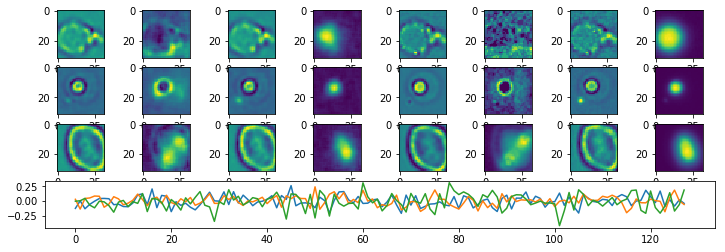

Epoch:  95 Iteration:  0 Loss:  3.09153 0.629782 0.000286222


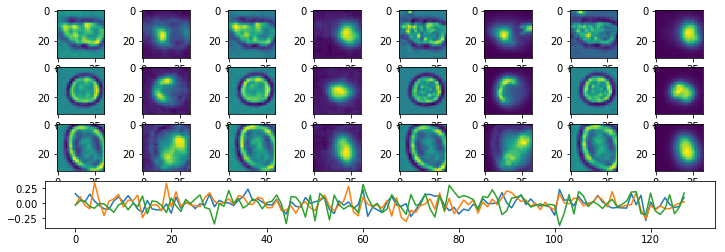

Epoch:  96 Iteration:  0 Loss:  3.04255 0.629757 0.00037834


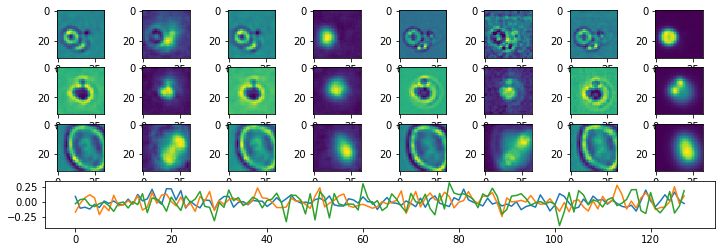

Epoch:  97 Iteration:  0 Loss:  3.06853 0.62977 0.000419319


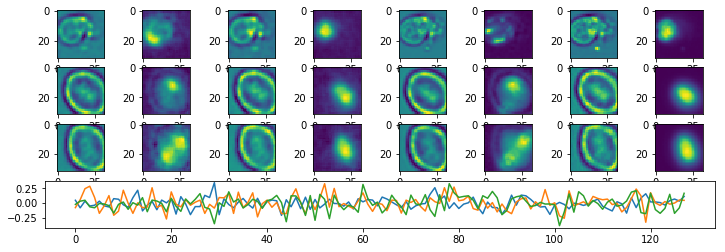

Epoch:  98 Iteration:  0 Loss:  3.03675 0.629753 0.000747144


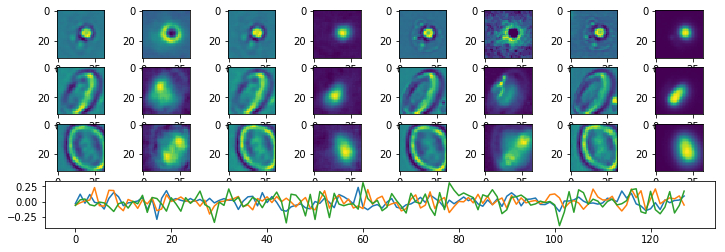

Epoch:  99 Iteration:  0 Loss:  3.0318 0.629752 0.000479966


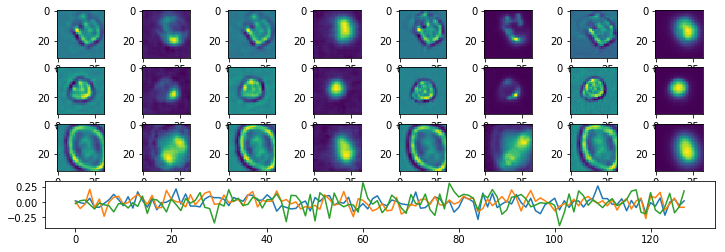

Epoch:  100 Iteration:  0 Loss:  3.04895 0.62976 0.000653297


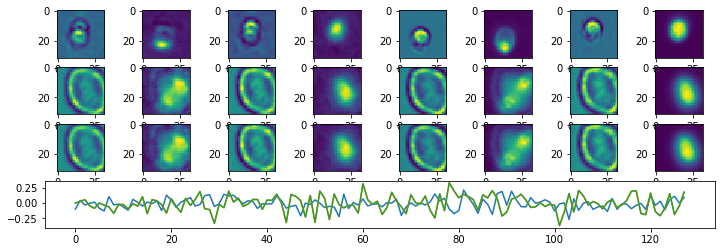

Epoch:  101 Iteration:  0 Loss:  2.97979 0.629725 0.000443667


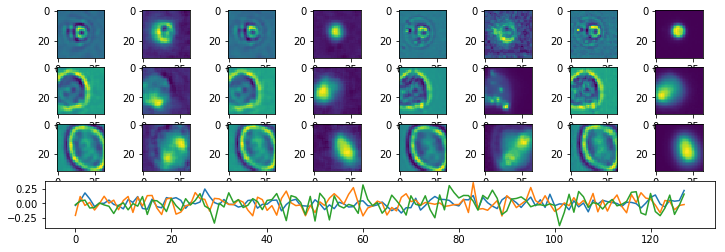

Epoch:  102 Iteration:  0 Loss:  3.00138 0.629736 0.000416934


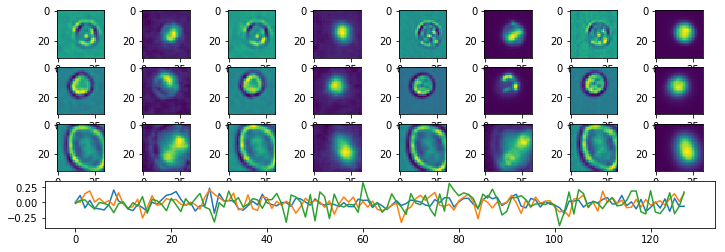

Epoch:  103 Iteration:  0 Loss:  2.9718 0.62972 0.000535101


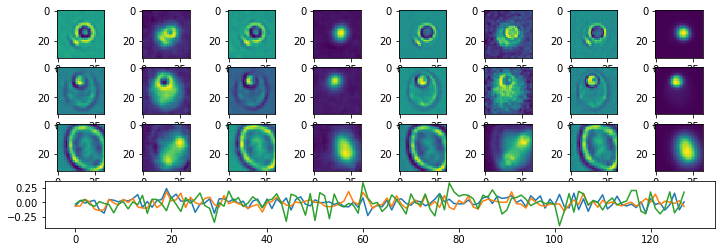

Epoch:  104 Iteration:  0 Loss:  2.97768 0.629724 0.000518471


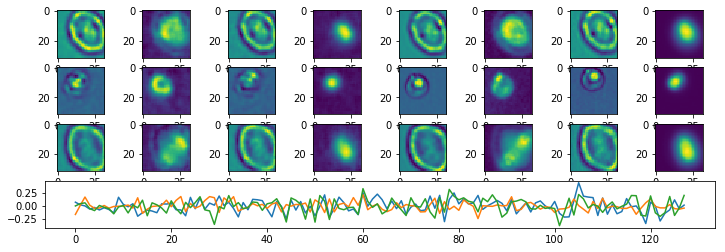

Epoch:  105 Iteration:  0 Loss:  2.96035 0.629715 0.000447571


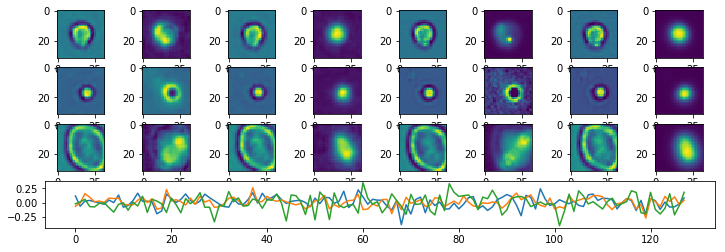

Epoch:  106 Iteration:  0 Loss:  2.97263 0.629722 0.000516742


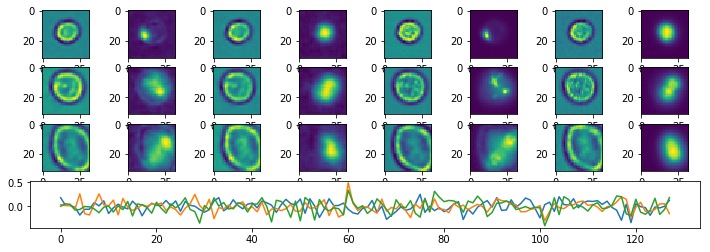

Epoch:  107 Iteration:  0 Loss:  2.95133 0.629712 0.000454783


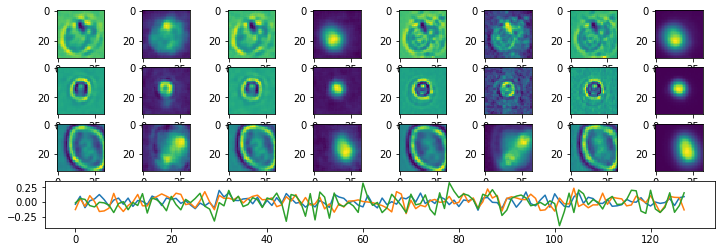

Epoch:  108 Iteration:  0 Loss:  2.91717 0.629693 0.00039041


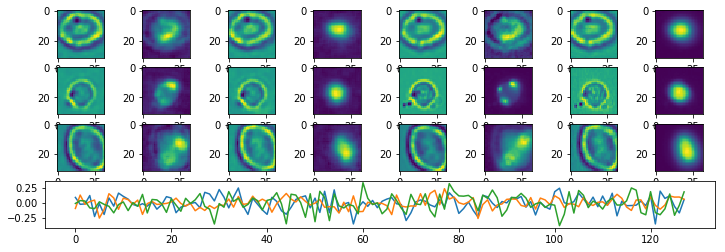

Epoch:  109 Iteration:  0 Loss:  7.33189 0.632024 0.000591993


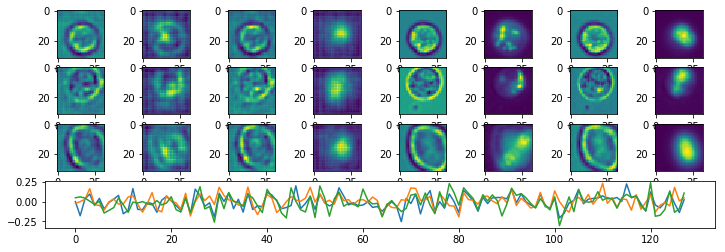

Epoch:  110 Iteration:  0 Loss:  3.60424 0.63005 0.000558138


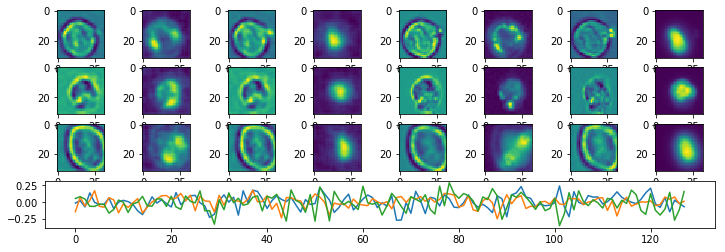

Epoch:  111 Iteration:  0 Loss:  3.38554 0.629936 0.000549823


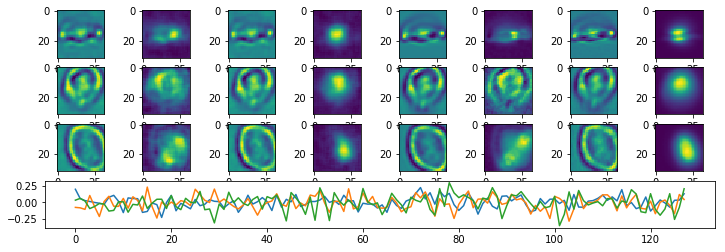

Epoch:  112 Iteration:  0 Loss:  3.29506 0.629888 0.000529736


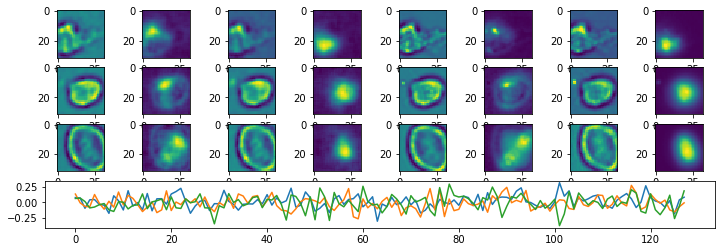

Epoch:  113 Iteration:  0 Loss:  3.27546 0.629877 0.000508308


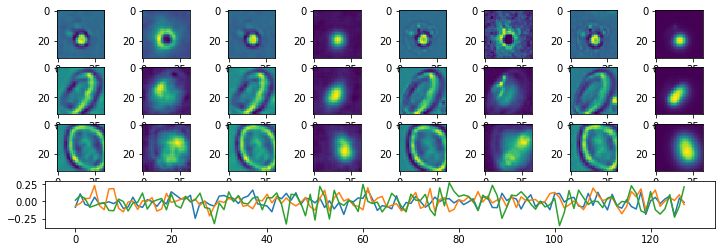

Epoch:  114 Iteration:  0 Loss:  3.20423 0.629841 0.000450164


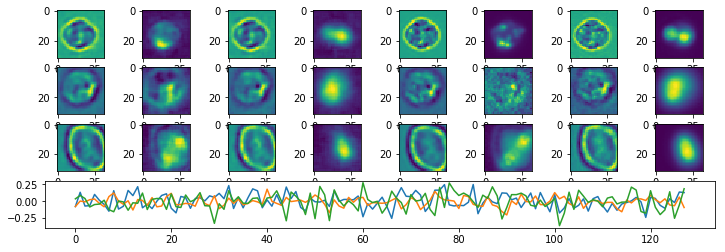

Epoch:  115 Iteration:  0 Loss:  3.14361 0.629809 0.000505805


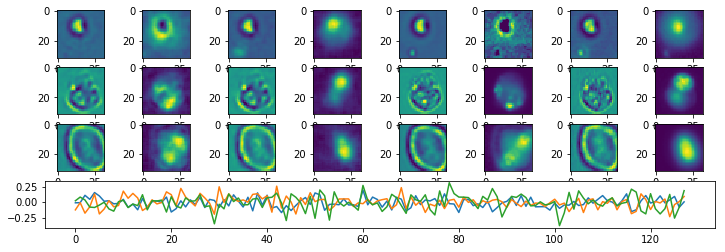

Epoch:  116 Iteration:  0 Loss:  3.16615 0.62982 0.000428617


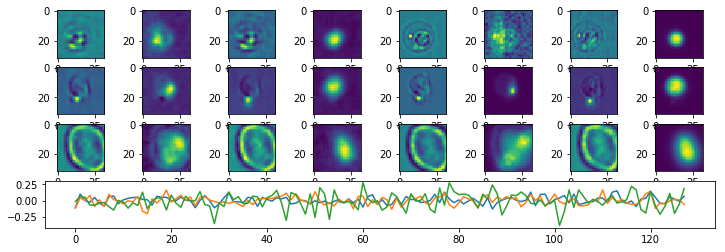

Epoch:  117 Iteration:  0 Loss:  3.13441 0.629804 0.000403196


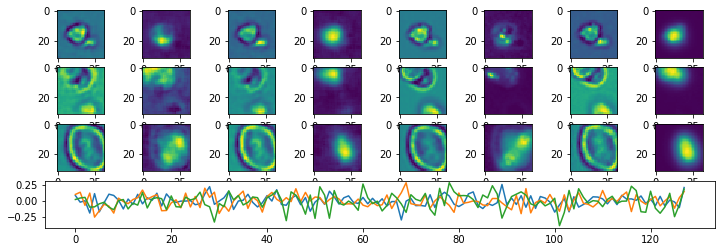

Epoch:  118 Iteration:  0 Loss:  3.09004 0.629781 0.000470042


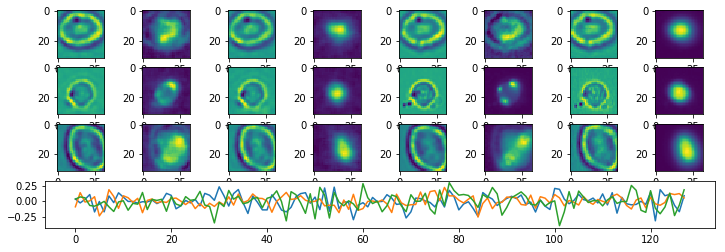

Epoch:  119 Iteration:  0 Loss:  3.09261 0.629783 0.000421584


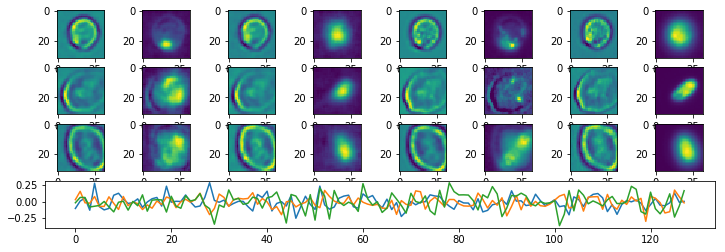

Done


In [4]:

p_mmdict = mmdict #{"Fish6_15_cjw_64.tif.mm": m3}
#             "plate04_all.mm": m4}

p_width = 32
p_height = 32
p_nchannels = 4
p_channels = [0,1,3,4]
p_nepochs = 120
p_batchsize = 128
p_learning_rate = 0.0001  #.00005
p_restore = False
p_latent_size = 128 #128 + 64
p_droprate = 0.95
p_stdev = .04

enc_sizes = [(128, 3), (256, 3), (512, 3)]  #128, 3)]
######enc_sizes = [(64, 3), (128, 3), (256,3), (512,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
#enc_sizes = [(16, 5), (32, 3), (64,3), (128,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
dec_sizes = list(reversed(enc_sizes))
#dec_sizes.append((p_nchannels,7))

params = dict()

params['width'] = p_width
params['height'] = p_height
params['nchannels'] = p_nchannels
params['channels'] = p_channels
params['nepochs'] = p_nepochs
params['batchsize'] = p_batchsize
params['learning_rate'] = p_learning_rate
params['restore'] = p_restore
params['latent_size'] = p_latent_size
params['droprate'] = p_droprate
params['stdev'] = p_stdev

params['enc_sizes'] = enc_sizes
params['dec_sizes'] = dec_sizes

cpdir = "/media/cjw/Data/cyto/Checkpoints/2018-04-25-LS128"

if not os.path.exists(cpdir):
    os.makedirs(cpdir)
autoencoder_train.train(p_mmdict, p_df, params, 500, cpdir)

In [7]:
x = 4
x

4